<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span></li></ul></div>

# Восстановление золота из руды

Подготовьте прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Используйте данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Вам нужно:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

Чтобы выполнить проект, обращайтесь к библиотекам *pandas*, *matplotlib* и *sklearn.* Вам поможет их документация. 

## Подготовка данных

In [1]:

!pip install --upgrade pip
!pip install pandas numpy matplotlib seaborn scikit-learn ydata-profiling



Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport

from sklearn.metrics import mean_absolute_error, make_scorer

from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from sklearn.model_selection import KFold, cross_val_score, cross_val_predict

from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer


### 1.1. Откройте файлы и изучите их

Чтение данных

In [ ]:
pd.set_option('display.max_columns', None)

try:
    df_train = pd.read_csv('gold_industry_train.csv')
    df_test = pd.read_csv('gold_industry_test.csv')
    df_full = pd.read_csv('gold_industry_full.csv')
except:
    df_train = pd.read_csv('/datasets/gold_industry_train.csv')
    df_test = pd.read_csv('/datasets/gold_industry_test.csv')
    df_full = pd.read_csv('/datasets/gold_industry_full.csv')

    # https://code.s3.yandex.net/datasets/gold_industry_train.csv
    # https://code.s3.yandex.net/datasets/gold_industry_test.csv
    # https://code.s3.yandex.net/datasets/gold_industry_full.csv
    

Изучение датасетов

In [4]:
%%time
profile1 = ProfileReport(df_test, minimal=True)
# profile1.to_file("profile_report_test.html")
profile1.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 53/53 [00:00<00:00, 145.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: total: 11.1 s
Wall time: 12.7 s


In [5]:
%%time
profile2 = ProfileReport(df_train, minimal=True)
# profile2.to_file("profile_report_train.html")
profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 87/87 [00:01<00:00, 54.40it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: total: 18.4 s
Wall time: 21.4 s


In [6]:
%%time
profile3 = ProfileReport(df_full, minimal=True)
# profile3.to_file("profile_report_full.html")
profile3.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 87/87 [00:01<00:00, 49.93it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: total: 18.8 s
Wall time: 21.8 s


Первичная оценка

train — 14579 строк, 87 признаков

test — 4860 строк, 53 признака

full — 19439 строк, 87 признаков

Есть пропущенные значения в числовых колонках и дата как строка

Сумма строк тестовой и обучающей выборки совпадает с количеством строк в полной выборке. Предположительно тестовая выборка очищена и подготовлена

### 1.2. Проверьте, что эффективность обогащения рассчитана правильно. Вычислите её на обучающей выборке для признака rougher.output.recovery. Найдите MAE между вашими расчётами и значением признака. Опишите выводы.

In [7]:
efficiency = df_train['rougher.output.recovery']
C = df_train['rougher.output.concentrate_au']
F = df_train['rougher.input.feed_au']
T = df_train['rougher.output.tail_au']

predict = ((C * (F - T)) / (F * (C - T))) * 100

mae = mean_absolute_error(efficiency, predict)
mae

9.83758577644259e-15

Абсолютная ошибка мала - формула эффективности обогащения корректна, recovery посчитан верно

### 1.3. Проанализируйте признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся?

In [8]:
missing = set(df_train.columns) - set(df_test.columns)
for feature in sorted(missing):
    print("-", feature)
print("\nВсего признаков:", len(missing))

- final.output.concentrate_ag
- final.output.concentrate_au
- final.output.concentrate_pb
- final.output.concentrate_sol
- final.output.recovery
- final.output.tail_ag
- final.output.tail_au
- final.output.tail_pb
- final.output.tail_sol
- primary_cleaner.output.concentrate_ag
- primary_cleaner.output.concentrate_au
- primary_cleaner.output.concentrate_pb
- primary_cleaner.output.concentrate_sol
- primary_cleaner.output.tail_ag
- primary_cleaner.output.tail_au
- primary_cleaner.output.tail_pb
- primary_cleaner.output.tail_sol
- rougher.calculation.au_pb_ratio
- rougher.calculation.floatbank10_sulfate_to_au_feed
- rougher.calculation.floatbank11_sulfate_to_au_feed
- rougher.calculation.sulfate_to_au_concentrate
- rougher.output.concentrate_ag
- rougher.output.concentrate_au
- rougher.output.concentrate_pb
- rougher.output.concentrate_sol
- rougher.output.recovery
- rougher.output.tail_ag
- rougher.output.tail_au
- rougher.output.tail_pb
- rougher.output.tail_sol
- secondary_cleaner.outp

Анализ пропущенных данных:

Из 34 признаков с пропущенными значениями:

- 30 относятся к параметрам продукта (концентраты, хвосты, содержание металлов)

- 4 — к расчётным характеристикам (например, коэффициенты и соотношения на этапе флотации)


По этапам процесса:

- На финальном этапе отсутствует 9 параметров продукта

- На этапе primary_cleaner — 8 параметров продукта

- На этапе rougher — 9 параметров продукта и 4 расчётных признака

- На этапе secondary_cleaner — 4 параметра продукта


Содержательная оценка:

- На всех этапах отсутствуют данные о хвостах (tail-фичи)

- Почти на всех этапах (кроме secondary_cleaner) не указано содержание металлов в продукте

- У этапов rougher и final отсутствуют признаки, связанные с эффективностью обогащения (recovery)

- Также на этапе флотации (rougher) недостаёт информации о части реагентов


Этих признаков нет, так как их невозможно измерить или получить во время выполнения технологического процесса.

### 1.4. Проведите предобработку данных.

Преобразование даты

In [9]:
for df in [df_train, df_test, df_full]:
    df['date'] = pd.to_datetime(df['date'], errors='coerce')

Удаление дубликатов

In [10]:
for df in [df_train, df_test, df_full]:
    df.drop_duplicates(inplace=True)

Проверка пропусков

In [11]:
df_train.isna().sum()
df_test.isna().sum()

date                                            0
rougher.input.feed_au                           0
rougher.input.feed_ag                           0
rougher.input.feed_pb                          28
rougher.input.feed_sol                         22
rougher.input.feed_rate                         4
rougher.input.feed_size                        44
rougher.input.floatbank10_sulfate               3
rougher.input.floatbank10_xanthate              1
rougher.state.floatbank10_a_air                 1
rougher.state.floatbank10_a_level               1
rougher.state.floatbank10_b_air                 1
rougher.state.floatbank10_b_level               1
rougher.state.floatbank10_c_air                 1
rougher.state.floatbank10_c_level               1
rougher.state.floatbank10_d_air                 0
rougher.state.floatbank10_d_level               0
rougher.state.floatbank10_e_air                 7
rougher.state.floatbank10_e_level               0
rougher.state.floatbank10_f_air                 0


Очистка обучающей выборки от пропусков

In [ ]:
len(df_train)

14579

In [13]:
df_train = df_train.ffill()
print("Пропущенных значений осталось:", df_train.isna().sum().sum())

Пропущенных значений осталось: 0


In [ ]:
len(df_train)

14579

В тестовой выборке удалять строки нельзя, так как изменится распределение модели - заполним их ближайшими данными по времени и по соседним значениям

In [15]:
df_test = df_test.ffill()
print("Пропущенных значений осталось:", df_test.isna().sum().sum())

Пропущенных значений осталось: 0


## 2. Проанализируйте данные

### 2.1. Посмотрите, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате. Какие особенности имеют распределения? Опишите выводы.

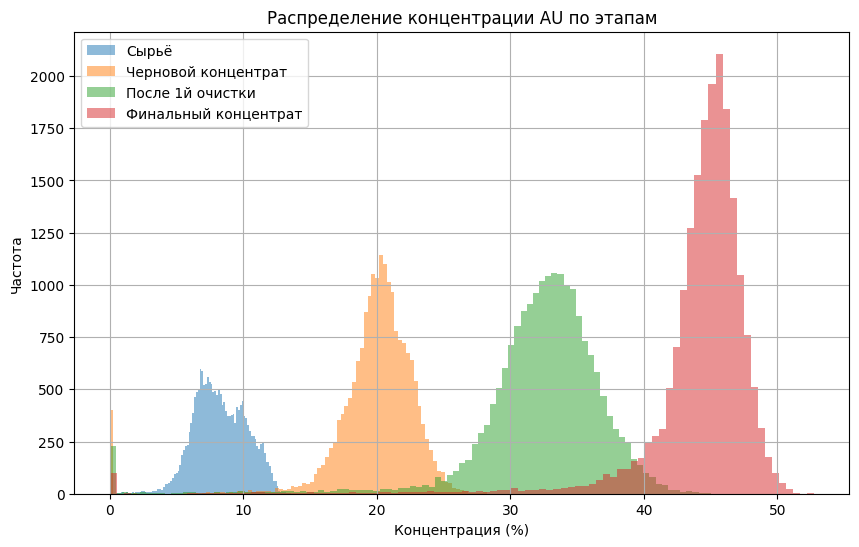

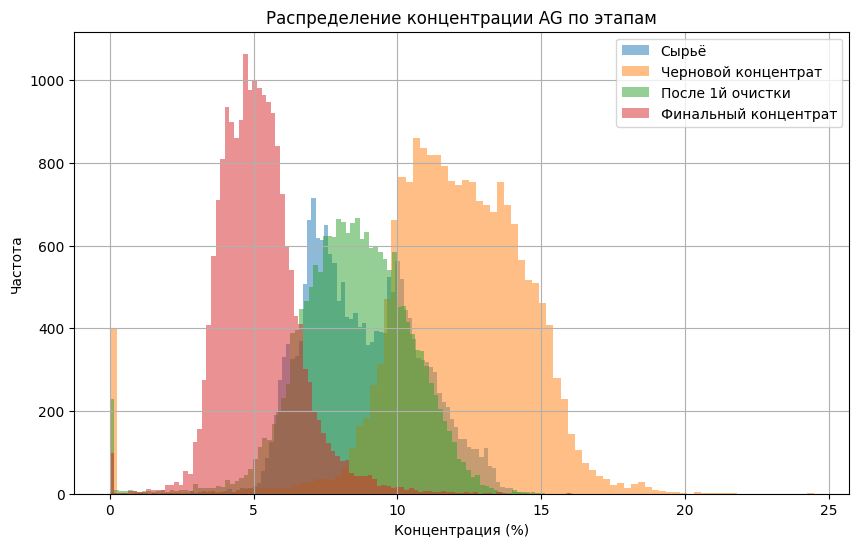

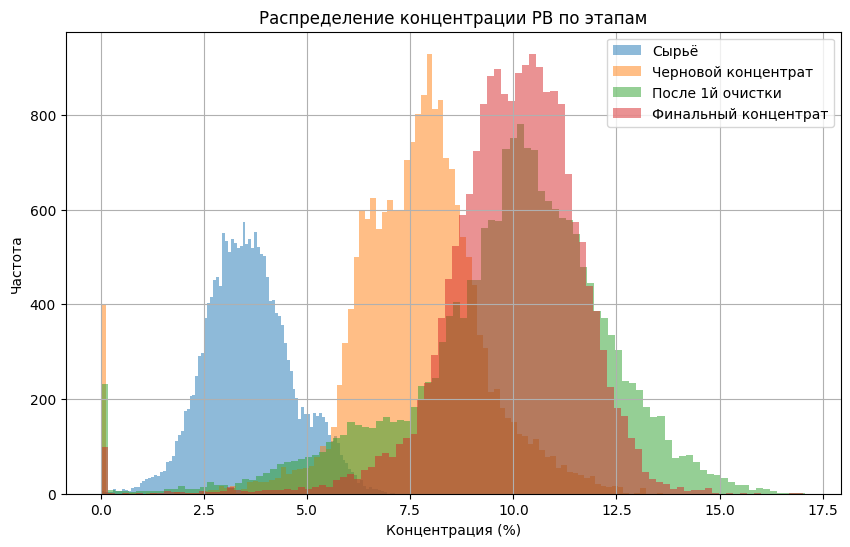

In [16]:
%matplotlib inline
metals = ['au', 'ag', 'pb']

colors = ['gold', 'silver', 'gray']

stages = {
    'Сырьё': 'rougher.input.feed_{}',
    'Черновой концентрат': 'rougher.output.concentrate_{}',
    'После 1й очистки': 'primary_cleaner.output.concentrate_{}',
    'Финальный концентрат': 'final.output.concentrate_{}',
}

for metal, color in zip(metals, colors):
    plt.figure(figsize=(10, 6))
    for stage_name, pattern in stages.items():
        column = pattern.format(metal)
        if column in df_full.columns:
            df_full[column].plot(kind='hist', bins=100, alpha=0.5, label=stage_name)
    plt.title(f'Распределение концентрации {metal.upper()} по этапам')
    plt.xlabel('Концентрация (%)')
    plt.ylabel('Частота')
    plt.legend()
    plt.grid(True)
    plt.show()


Формы распределений:
- Золото - симметричные и узкие на каждом этапе, особенно на финальном.
- Серебро - финальный концентрат имеет пик в левой части — серебра там меньше.
- Свинец - плавный переход от левого к правому смещению.

Изменение концентрации:
- Золото - с каждым этапом обработки средняя концентрация золота значительно увеличивается, а распределение сужается, что указывает на повышение чистоты и однородности продукта
- Серебро - концентрация не растёт линейно. После 1-й очистки и на финальном этапе серебро, скорее всего, удаляется как примесь. Это указывает на приоритет обогащения золота, даже если это сопровождается снижением содержания серебра
- Свинец - Концентрация постепенно увеличивается на каждом этапе. Основной рост происходит между сырьём и черновым концентратом, после чего идёт плавная стабилизация. Финальный продукт имеет высокую и стабильную концентрацию свинца, что говорит об эффективной очистке и целенаправленном извлечении Pb.

### 2.2. Сравните распределения размеров гранул исходного сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

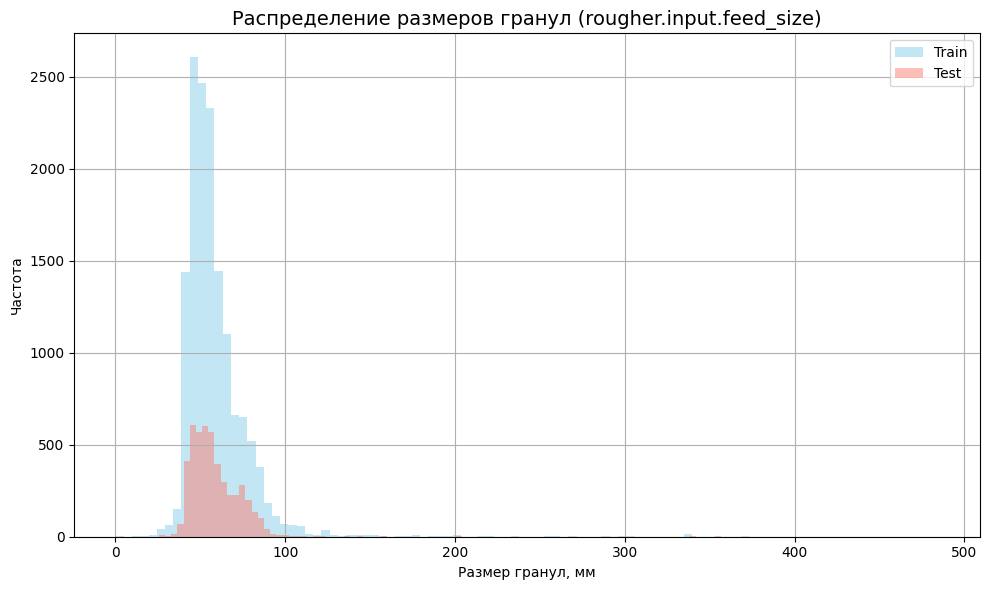

In [17]:
plt.figure(figsize=(10, 6))

colors = {'train': 'skyblue', 'test': 'salmon'}

for frame, name in zip([df_train, df_test], ["train", "test"]):
    subset = frame["rougher.input.feed_size"].dropna()
    subset.plot(kind='hist', 
                bins=100, 
                alpha=0.5,
                label=name.capitalize(), 
                color=colors[name])

plt.title('Распределение размеров гранул (rougher.input.feed_size)', fontsize=14)
plt.xlabel('Размер гранул, мм')
plt.ylabel('Частота')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Распределения очень похожи по форме:
— Основной пик в обеих выборках находится в районе 55–75 мм.
— Хвосты тоже сходные, экстремальные значения редки.

Тестовая выборка немного уже и чуть смещена влево — но не критично.

Выбросов или аномальных различий нет, структуры похожи.

Распределения не сильно отличаются.

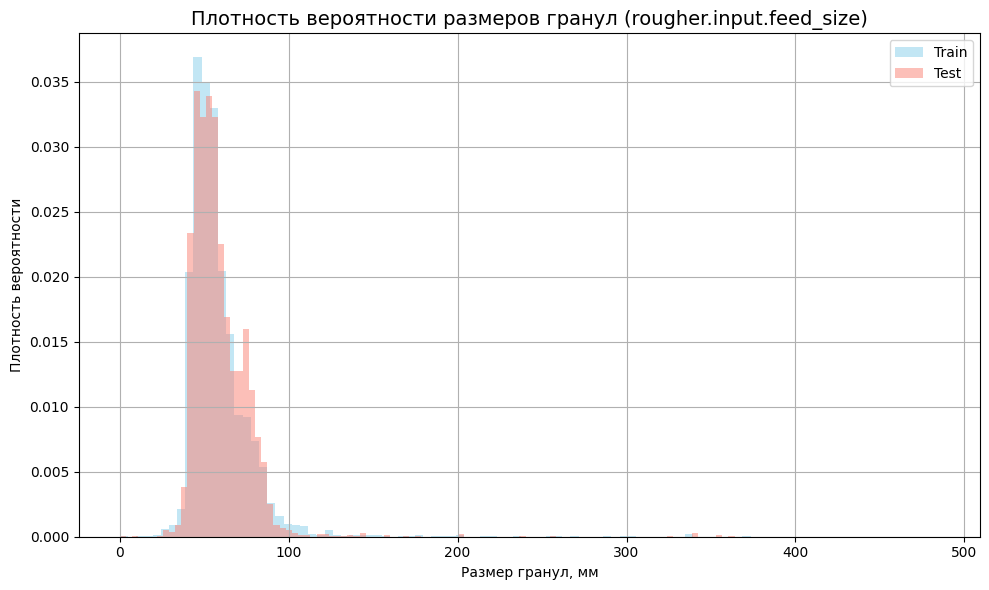

In [18]:
plt.figure(figsize=(10, 6))

colors = {'train': 'skyblue', 'test': 'salmon'}

for frame, name in zip([df_train, df_test], ["train", "test"]):
    subset = frame["rougher.input.feed_size"].dropna()
    subset.plot(kind='hist', 
                bins=100, 
                alpha=0.5,
                density=True,
                label=name.capitalize(), 
                color=colors[name])

plt.title('Плотность вероятности размеров гранул (rougher.input.feed_size)', fontsize=14)
plt.xlabel('Размер гранул, мм')
plt.ylabel('Плотность вероятности')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Оба распределения похожи по форме — нормализованные, с ярко выраженным пиком. Присутствуют редкие выбросы.



### 2.3. Исследуйте суммарную концентрацию металлов на разных стадиях: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате.

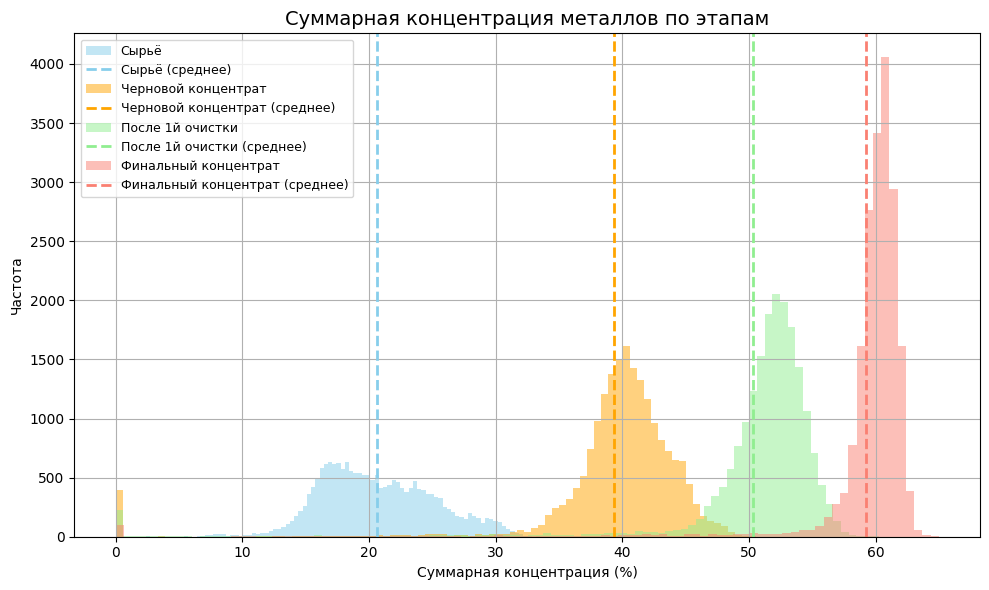

In [19]:
stages = {
    'Сырьё': ['rougher.input.feed_au', 'rougher.input.feed_ag', 'rougher.input.feed_pb'],
    'Черновой концентрат': ['rougher.output.concentrate_au', 'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb'],
    'После 1й очистки': ['primary_cleaner.output.concentrate_au', 'primary_cleaner.output.concentrate_ag', 'primary_cleaner.output.concentrate_pb'],
    'Финальный концентрат': ['final.output.concentrate_au', 'final.output.concentrate_ag', 'final.output.concentrate_pb'],
}

colors = {
    'Сырьё': 'skyblue',
    'Черновой концентрат': 'orange',
    'После 1й очистки': 'lightgreen',
    'Финальный концентрат': 'salmon',
}

total_concentration = {}

for stage, columns in stages.items():
    if all(col in df_full.columns for col in columns):
        total_concentration[stage] = df_full[columns].sum(axis=1)

plt.figure(figsize=(10, 6))
for stage, series in total_concentration.items():
    series.plot(kind='hist', bins=100, alpha=0.5, label=stage, color=colors[stage])
    
    mean_val = series.mean()
    plt.axvline(mean_val, color=colors[stage], linestyle='--', linewidth=2, label=f'{stage} (среднее)')

plt.title('Суммарная концентрация металлов по этапам', fontsize=14)
plt.xlabel('Суммарная концентрация (%)')
plt.ylabel('Частота')
plt.legend(fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()



Сырьё: 
- Суммарная концентрация низкая, распределение широкое.
- Среднее значение ≈ 22%
- Присутствует много значений близких к нулю — часть сырья малометалльная.


Черновой концентрат:
- Концентрация значительно возрастает.
- Среднее значение ≈ 40%
- Распределение сужается, продукт становится более однородным.


После 1-й очистки:
- Ещё один скачок вверх.
- Среднее значение ≈ 50%
- Узкое распределение — хороший контроль качества.


Финальный концентрат:
- Самая высокая концентрация.
- Среднее значение ≈ 60%
- Очень узкое распределение — стабильный продукт высокого качества.



Вывод:
Наблюдается устойчивый рост суммарной концентрации металлов на каждом этапе.
Очистка работает эффективно — не только увеличивается доля металлов, но и снижается разброс.
Финальный концентрат — это максимально обогащённый и однородный продукт.

Подробное рассмотрение выбросов

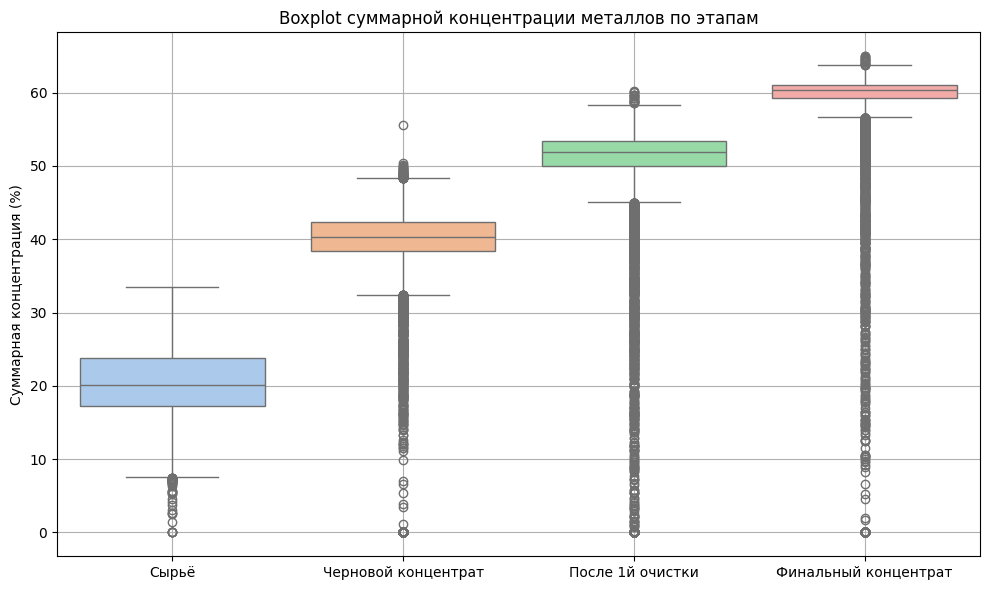

In [20]:
stages = {
    'Сырьё': ['rougher.input.feed_au', 'rougher.input.feed_ag', 'rougher.input.feed_pb'],
    'Черновой концентрат': ['rougher.output.concentrate_au', 'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb'],
    'После 1й очистки': ['primary_cleaner.output.concentrate_au', 'primary_cleaner.output.concentrate_ag', 'primary_cleaner.output.concentrate_pb'],
    'Финальный концентрат': ['final.output.concentrate_au', 'final.output.concentrate_ag', 'final.output.concentrate_pb'],
}

summary_df = pd.DataFrame()
for stage, cols in stages.items():
    if all(col in df_full.columns for col in cols):
        summary_df[stage] = df_full[cols].sum(axis=1)

plt.figure(figsize=(10, 6))
sns.boxplot(data=summary_df, palette='pastel')
plt.title('Boxplot суммарной концентрации металлов по этапам')
plt.ylabel('Суммарная концентрация (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


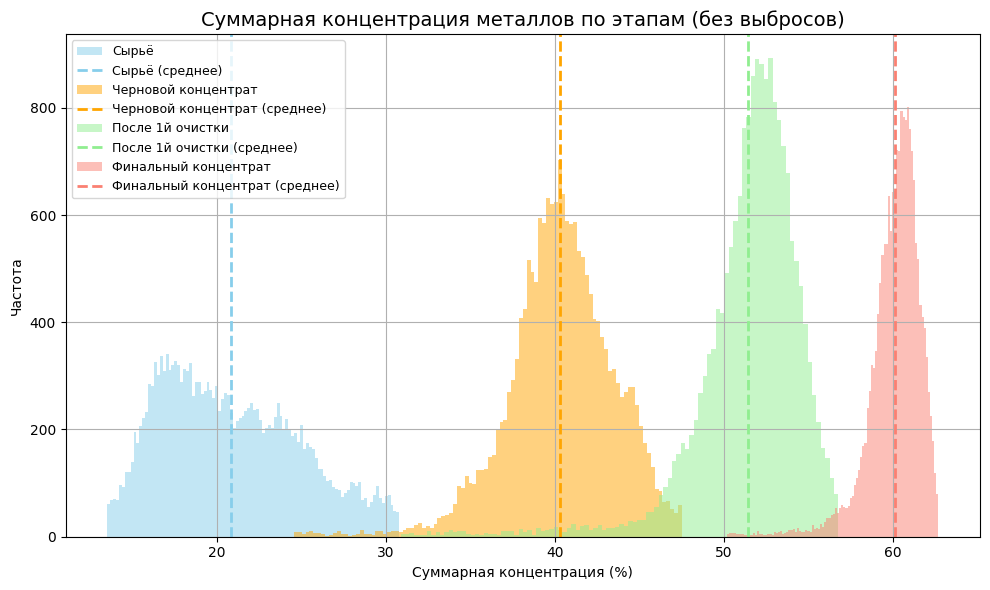

In [21]:
filtered_concentration = {}

for stage, columns in stages.items():
    if all(col in df_full.columns for col in columns):
        series = df_full[columns].sum(axis=1)
        q3 = series.quantile(0.03)
        q99 = series.quantile(0.99)
        filtered_concentration[stage] = series[(series >= q3) & (series <= q99)]

plt.figure(figsize=(10, 6))
for stage, series in filtered_concentration.items():
    series.plot(kind='hist', bins=100, alpha=0.5, label=stage, color=colors[stage])
    
    mean_val = series.mean()
    plt.axvline(mean_val, color=colors[stage], linestyle='--', linewidth=2, label=f'{stage} (среднее)')

plt.title('Суммарная концентрация металлов по этапам (без выбросов)', fontsize=14)
plt.xlabel('Суммарная концентрация (%)')
plt.ylabel('Частота')
plt.legend(fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()
df_filtered = pd.DataFrame(filtered_concentration)

Ушли длинные хвосты и резкие выбросы.
Каждое распределение — симметричнее и ближе к нормальному.

Средние значения скорректировались:
Сдвинулись ближе к пикам, особенно у сырья и финального концентрата.
Теперь они лучше отражают "типичную" концентрацию на каждом этапе.

Концентрация металлов постепенно увеличивается - всё более однородный продукт.

## Модель

### 3.1. Напишите функцию для вычисления итоговой sMAPE.

In [22]:
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    # Избегаем деления на ноль
    denominator = np.where(denominator == 0, 1e-8, denominator)
    return np.mean(numerator / denominator) * 100


def final_smape(y_true_rougher, y_pred_rougher, y_true_final, y_pred_final):
    smape_rougher = smape(y_true_rougher, y_pred_rougher)
    smape_final = smape(y_true_final, y_pred_final)
    return 0.25 * smape_rougher + 0.75 * smape_final


smape_scorer = make_scorer(smape, greater_is_better=False)

### 3.2. Обучите разные модели и оцените их качество кросс-валидацией. Выберите лучшую модель и проверьте её на тестовой выборке. Опишите выводы.

In [23]:
features_to_drop = ['date', 'rougher.output.recovery', 'final.output.recovery']
X = df_train.drop(columns=features_to_drop, errors='ignore')
y_rougher = df_train['rougher.output.recovery']
y_final = df_train['final.output.recovery']

models = {
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0)
}

results = {}

for name, base_model in models.items():
    print(f"\nОцениваем модель: {name}")

    model_pipeline = make_pipeline(SimpleImputer(strategy='median'), base_model)

    smape_r_scores = -cross_val_score(model_pipeline, X, y_rougher,
                                      cv=5, scoring=smape_scorer)

    smape_f_scores = -cross_val_score(model_pipeline, X, y_final,
                                      cv=5, scoring=smape_scorer)

    smape_r_mean = np.mean(smape_r_scores)
    smape_f_mean = np.mean(smape_f_scores)
    final_score = 0.25 * smape_r_mean + 0.75 * smape_f_mean

    results[name] = {
        'Итоговое sMAPE': round(final_score, 3),
        'sMAPE rougher': round(smape_r_mean, 3),
        'sMAPE final': round(smape_f_mean, 3)
    }

results_df = pd.DataFrame(results).T.sort_values(by='Итоговое sMAPE')
print("\n Сравнение моделей:\n")
print(results_df)


Оцениваем модель: Gradient Boosting

Оцениваем модель: Random Forest

Оцениваем модель: Linear Regression

Оцениваем модель: Ridge Regression

 Сравнение моделей:

                   Итоговое sMAPE  sMAPE rougher  sMAPE final
Random Forest               2.218          1.150        2.574
Gradient Boosting           4.489          6.925        3.676
Ridge Regression            6.763         10.780        5.425
Linear Regression           6.764         10.782        5.425


Random Forest лучше всего предсказывает финальное обогащение — ошибки в районе 2.5% — это отлично!

rougher.output.recovery — совсем близко к 1%.

Random Forest — лучший выбор, он даёт самую низкую итоговую ошибку (в 2-3 раза меньше других моделей).



In [26]:
available_features = df_test.columns.intersection(df_train.columns)
features_to_drop = ['date', 'rougher.output.recovery', 'final.output.recovery']
X = df_train[available_features.difference(features_to_drop)]
y_rougher = df_train['rougher.output.recovery']
y_final = df_train['final.output.recovery']
feature_names = X.columns

model_r = make_pipeline(SimpleImputer(strategy='median'), RandomForestRegressor(random_state=42, n_estimators=100))
model_f = make_pipeline(SimpleImputer(strategy='median'), RandomForestRegressor(random_state=42, n_estimators=100))
model_r.fit(X, y_rougher)
model_f.fit(X, y_final)

target = df_full[['date', 'rougher.output.recovery', 'final.output.recovery']]
df_test_with_targets = df_test.merge(target, on='date', how='left')

features_for_imputation = df_test_with_targets.drop(columns=['date'])
imputer = KNNImputer()
imputed = imputer.fit_transform(features_for_imputation)

test_processed = pd.DataFrame(imputed, columns=features_for_imputation.columns, index=df_test_with_targets.index)
target_test_rougher = test_processed["rougher.output.recovery"]
target_test_final = test_processed["final.output.recovery"]
X_test = test_processed[feature_names]

pred_rougher = model_r.predict(X_test)
pred_final = model_f.predict(X_test)

final_score = final_smape(target_test_rougher, pred_rougher,
                          target_test_final, pred_final)

smape_r = smape(target_test_rougher, pred_rougher)
smape_f = smape(target_test_final, pred_final)

print("\nФинальные результаты модели Random Forest:")
print(f"sMAPE rougher: {smape_r:.2f}%")
print(f"sMAPE final:   {smape_f:.2f}%")
print(f"Итоговое sMAPE: {final_score:.2f}%")


Финальные результаты модели Random Forest:
sMAPE rougher: 3.49%
sMAPE final:   6.35%
Итоговое sMAPE: 5.63%


В рамках задания были обучены и оценены четыре модели: Gradient Boosting, Random Forest, Linear Regression и Ridge Regression.
Оценка производилась по метрике итоговое sMAPE, учитывающей предсказания эффективности обогащения (rougher) и финального восстановления (final).

По результатам кросс-валидации лучшей моделью оказался Random Forest.
Модель была протестирована на тестовой выборке с учётом только доступных на практике признаков.

Результаты Random Forest на тестовой выборке:

sMAPE rougher: 3.49%

sMAPE final: 6.35%

Итоговое sMAPE: 5.63%

Таким образом, модель демонстрирует достаточно высокую точность предсказаний, особенно на финальной стадии, что позволяет рекомендовать её для дальнейшего использования в задаче прогнозирования эффективности технологического процесса.